<a href="https://colab.research.google.com/github/santiagorg2401/tensorflow_course_exercises/blob/main/04_TransferLearning_02_FineTuning.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Transfer Learning with TensorFlow part 2: Fine Tuning.
Fine tuning trains an X amount of layers from the original model, this requires to have more data than feature extraction.

## Solve importations.
From now on, the helper functions are available in helper_functions.py.

In [2]:
import random
import numpy as np
import tensorflow as tf
import helper_functions as hf
import matplotlib.pyplot as plt

from tensorflow.keras import layers
from tensorflow.keras.preprocessing import image_dataset_from_directory

# Check tensorflow version and get physical devices.
print(f"TensorFlow version: {tf.__version__}")
physical_devices = tf.config.list_physical_devices('GPU')
print(f"Physical GPUs: {physical_devices}")

TensorFlow version: 2.9.0
Physical GPUs: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


## Import and load the data.

### 10_food_classes_10_percent

There are 2 directories and 0 images in '10_food_classes_10_percent'.
There are 10 directories and 0 images in '10_food_classes_10_percent/test'.
There are 0 directories and 250 images in '10_food_classes_10_percent/test/grilled_salmon'.
There are 0 directories and 250 images in '10_food_classes_10_percent/test/steak'.
There are 0 directories and 250 images in '10_food_classes_10_percent/test/chicken_curry'.
There are 0 directories and 250 images in '10_food_classes_10_percent/test/fried_rice'.
There are 0 directories and 250 images in '10_food_classes_10_percent/test/chicken_wings'.
There are 0 directories and 250 images in '10_food_classes_10_percent/test/pizza'.
There are 0 directories and 250 images in '10_food_classes_10_percent/test/ramen'.
There are 0 directories and 250 images in '10_food_classes_10_percent/test/hamburger'.
There are 0 directories and 250 images in '10_food_classes_10_percent/test/ice_cream'.
There are 0 directories and 250 images in '10_food_classes_10_percent

2022-12-19 12:45:05.978698: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-12-19 12:45:05.979165: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:975] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-12-19 12:45:05.979308: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:975] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-12-19 12:45:05.979403: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:975] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zer

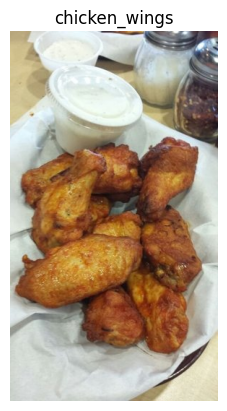

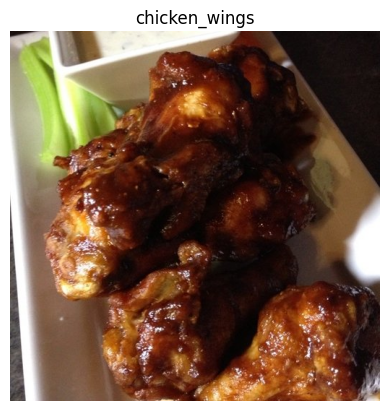

['2005848.jpg']
Image shape: (491, 512, 3)
['137699.jpg']
Image shape: (384, 512, 3)


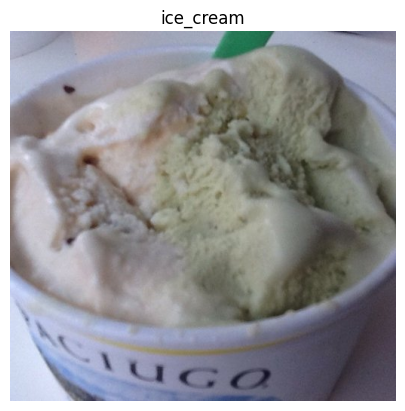

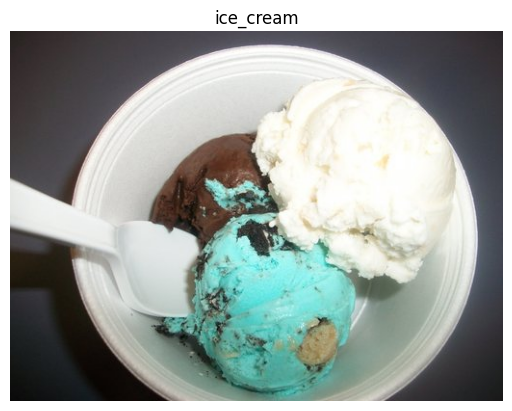

In [3]:
# Get data and walk through its directory.
try:
  hf.unzip_data("10_food_classes_10_percent.zip")
except:
  !wget https://storage.googleapis.com/ztm_tf_course/food_vision/10_food_classes_10_percent.zip
  hf.unzip_data("10_food_classes_10_percent.zip")

hf.walk_through_dir("10_food_classes_10_percent")

# Set up paths.
train_dir = "10_food_classes_10_percent/train/"
test_dir = "10_food_classes_10_percent/test/"

# Set up parameters.
IMG_SIZE = (224, 224)
BATCH_SIZE = 32

# Import dataset.
print("\nImporting and batching the dataset.")
train_data_10_percent = image_dataset_from_directory(directory=train_dir,
                                                     image_size=IMG_SIZE,
                                                     label_mode="categorical",
                                                     batch_size=BATCH_SIZE)

# The same test dataset will be used across the experiments to ensure consistent results.
test_data = image_dataset_from_directory(directory=test_dir,
                                                    image_size=IMG_SIZE,
                                                    label_mode="categorical",
                                                    batch_size=BATCH_SIZE)

# Check class names.
class_names = test_data.class_names
print(f"\nThe dataset class names are: {class_names}")

# Visualize.
img = hf.view_random_image(target_dir=train_dir,
                        target_class='chicken_wings',
                        i=2)

img = hf.view_random_image(target_dir=train_dir,
                        target_class='ice_cream',
                        i=2)

### 10_food_classes_1_percent

There are 2 directories and 0 images in '10_food_classes_1_percent'.
There are 10 directories and 0 images in '10_food_classes_1_percent/test'.
There are 0 directories and 250 images in '10_food_classes_1_percent/test/grilled_salmon'.
There are 0 directories and 250 images in '10_food_classes_1_percent/test/steak'.
There are 0 directories and 250 images in '10_food_classes_1_percent/test/chicken_curry'.
There are 0 directories and 250 images in '10_food_classes_1_percent/test/fried_rice'.
There are 0 directories and 250 images in '10_food_classes_1_percent/test/chicken_wings'.
There are 0 directories and 250 images in '10_food_classes_1_percent/test/pizza'.
There are 0 directories and 250 images in '10_food_classes_1_percent/test/ramen'.
There are 0 directories and 250 images in '10_food_classes_1_percent/test/hamburger'.
There are 0 directories and 250 images in '10_food_classes_1_percent/test/ice_cream'.
There are 0 directories and 250 images in '10_food_classes_1_percent/test/sushi'

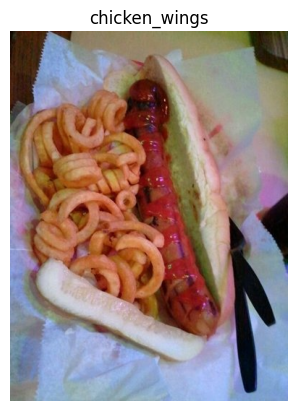

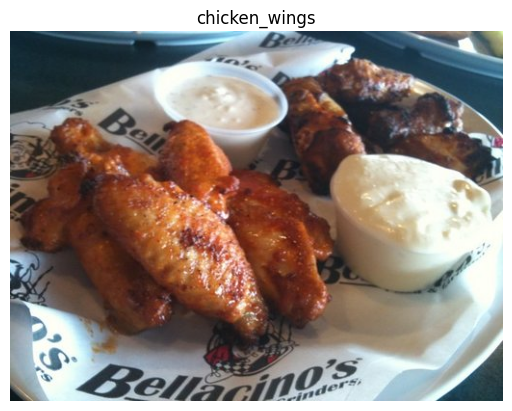

['2225554.jpg']
Image shape: (512, 512, 3)
['2225554.jpg']
Image shape: (512, 512, 3)


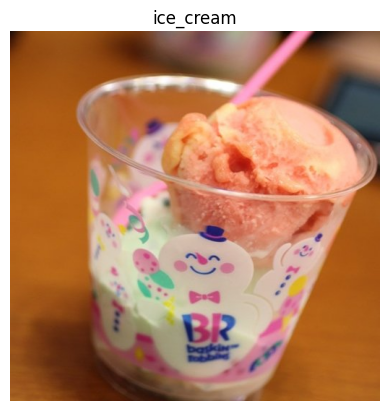

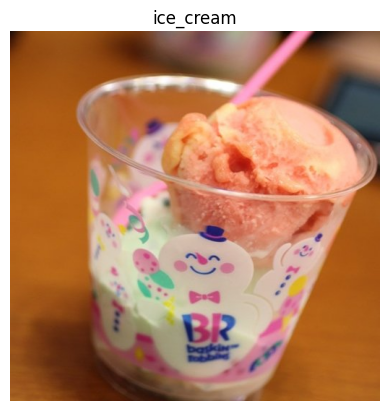

In [4]:
# Get data and walk through its directory.
try:
  hf.unzip_data("10_food_classes_1_percent.zip")
except:
  !wget https://storage.googleapis.com/ztm_tf_course/food_vision/10_food_classes_1_percent.zip
  hf.unzip_data("10_food_classes_1_percent.zip")

hf.walk_through_dir("10_food_classes_1_percent")

# Set up paths.
train_dir_1_percent = "10_food_classes_1_percent/train/"

# Set up parameters.
IMG_SIZE = (224, 224)
BATCH_SIZE = 32

# Import dataset.
print("\nImporting and batching the dataset.")
train_data_1_percent = image_dataset_from_directory(directory=train_dir_1_percent,
                                                     image_size=IMG_SIZE,
                                                     label_mode="categorical",
                                                     batch_size=BATCH_SIZE)

# Check class names.
print(f"\nThe dataset class names are: {train_data_1_percent.class_names}")

# Visualize.
img = hf.view_random_image(target_dir=train_dir_1_percent,
                        target_class='chicken_wings',
                        i=2)

img = hf.view_random_image(target_dir=train_dir_1_percent,
                        target_class='ice_cream',
                        i=2)

### 10_food_classes_all_data

There are 2 directories and 0 images in '10_food_classes_all_data'.
There are 10 directories and 0 images in '10_food_classes_all_data/test'.
There are 0 directories and 250 images in '10_food_classes_all_data/test/grilled_salmon'.
There are 0 directories and 250 images in '10_food_classes_all_data/test/steak'.
There are 0 directories and 250 images in '10_food_classes_all_data/test/chicken_curry'.
There are 0 directories and 250 images in '10_food_classes_all_data/test/fried_rice'.
There are 0 directories and 250 images in '10_food_classes_all_data/test/chicken_wings'.
There are 0 directories and 250 images in '10_food_classes_all_data/test/pizza'.
There are 0 directories and 250 images in '10_food_classes_all_data/test/ramen'.
There are 0 directories and 250 images in '10_food_classes_all_data/test/hamburger'.
There are 0 directories and 250 images in '10_food_classes_all_data/test/ice_cream'.
There are 0 directories and 250 images in '10_food_classes_all_data/test/sushi'.
There are 

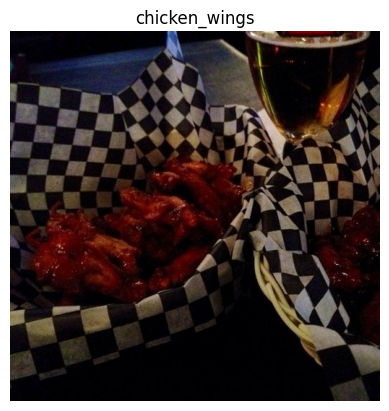

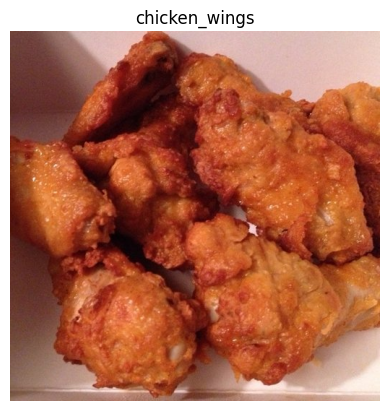

['3342070.jpg']
Image shape: (384, 512, 3)
['3583476.jpg']
Image shape: (512, 512, 3)


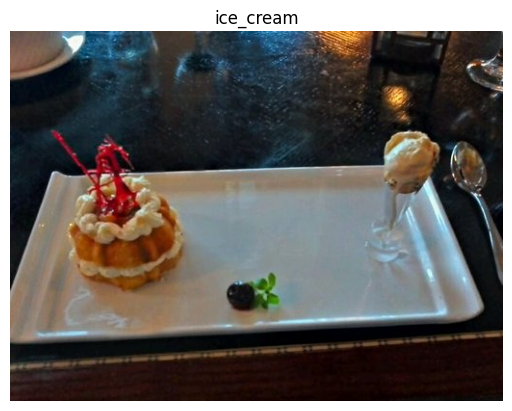

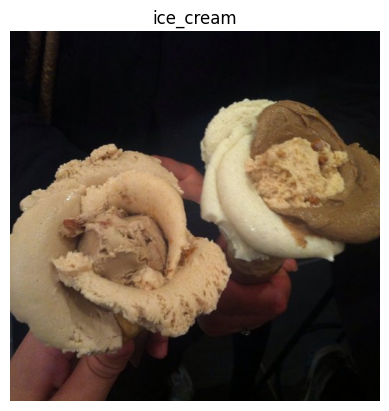

In [97]:
# Get data and walk through its directory.
try:
  hf.unzip_data("10_food_classes_all_data.zip")
except:
  !wget https://storage.googleapis.com/ztm_tf_course/food_vision/10_food_classes_all_data.zip
  hf.unzip_data("10_food_classes_all_data.zip")

hf.walk_through_dir("10_food_classes_all_data")

# Set up paths.
train_dir_all_data = "10_food_classes_all_data/train/"

# Set up parameters.
IMG_SIZE = (224, 224)
BATCH_SIZE = 32

# Import dataset.
print("\nImporting and batching the dataset.")
train_data_all_data = image_dataset_from_directory(directory=train_dir_all_data,
                                                   image_size=IMG_SIZE,
                                                   batch_size=BATCH_SIZE,
                                                   label_mode="categorical")

# Check class names.
print(f"\nThe datasaet class names are: {train_data_all_data.class_names}")

# Visualize.
img = hf.view_random_image(target_dir=train_dir_all_data,
                        target_class='chicken_wings',
                        i=2)

img = hf.view_random_image(target_dir=train_dir_all_data,
                        target_class='ice_cream',
                        i=2)

## Getting a feature vector from a trained model.

In [5]:
# Define the input shape.
input_shape = (1, 4, 4, 3)

# Create a random tensor.
tf.random.set_seed(42)
input_tensor = tf.random.normal(input_shape)
print(f"Random input tensor:\n {input_tensor}")

# Pass the random tensor through a global average 2d layer.
global_average_pooled_tensor = tf.keras.layers.GlobalAveragePooling2D()(input_tensor)
print(f"\n2D global average pooled tensor:\n {global_average_pooled_tensor}")

# And now through a MaxPool2D.
max_pooled_tensor = tf.keras.layers.GlobalMaxPool2D()(input_tensor)
print(f"2D  Global Max pooled tensor:\n {max_pooled_tensor}")

# check shapes.
print(f"\nShape of input tensor: {input_tensor.shape}")
print(f"Shape of Global Average Pooled 2D tensor: {global_average_pooled_tensor.shape}")
print(f"Shape of Global Macx Pooled 2D tensor: {max_pooled_tensor.shape}")

Random input tensor:
 [[[[ 0.3274685  -0.8426258   0.3194337 ]
   [-1.4075519  -2.3880599  -1.0392479 ]
   [-0.5573232   0.539707    1.6994323 ]
   [ 0.28893656 -1.5066116  -0.2645474 ]]

  [[-0.59722406 -1.9171132  -0.62044144]
   [ 0.8504023  -0.40604794 -3.0258412 ]
   [ 0.9058464   0.29855987 -0.22561555]
   [-0.7616443  -1.8917141  -0.93847126]]

  [[ 0.77852213 -0.47338897  0.97772694]
   [ 0.24694404  0.20573747 -0.5256233 ]
   [ 0.32410017  0.02545409 -0.10638497]
   [-0.6369475   1.1603122   0.2507359 ]]

  [[-0.41728503  0.4012578  -1.4145443 ]
   [-0.5931857  -1.6617213   0.33567193]
   [ 0.10815629  0.23479682 -0.56668764]
   [-0.35819843  0.88698614  0.52744764]]]]

2D global average pooled tensor:
 [[-0.09368646 -0.45840448 -0.2885598 ]]
2D  Global Max pooled tensor:
 [[0.9058464 1.1603122 1.6994323]]

Shape of input tensor: (1, 4, 4, 3)
Shape of Global Average Pooled 2D tensor: (1, 3)
Shape of Global Macx Pooled 2D tensor: (1, 3)


In [6]:
# Replicate the Global Average Pool 2D layer.
tf.reduce_mean(input_tensor, axis=[1, 2])

<tf.Tensor: shape=(1, 3), dtype=float32, numpy=array([[-0.09368646, -0.45840448, -0.2885598 ]], dtype=float32)>

## `model_0` EfficientNetB0 baseline with feature extraction on 10% of training data.
Build a transfer learning model using the Keras Functional API as it is more flexible than the Sequential API.

### Create the model.

In [7]:
# 1. Create base model.
base_model = tf.keras.applications.EfficientNetB0(include_top=False)

# Freeze the base model so the already trained weights are not altered.
base_model.trainable = False

# Create inputs into the model.
inputs = tf.keras.layers.Input(shape=(224, 224, 3), name="input_layer")

# Create normalizing layer (Functional API advantage) 
# (this baseline already has rescaling built in, left just for pipeline.)
# x = tf.keras.layers.experimental.preprocessing.Rescaling(1./255)(inputs)

# Pass the inputs to model.
x = base_model(inputs)

# Average pool the outputs of model.
x = tf.keras.layers.GlobalAveragePooling2D(name="global_average_pooling_layer")(x)

# Create the output activation layer.
outputs = tf.keras.layers.Dense(10, activation="softmax", name="output_layer")(x)

# Combine the inputs with the outputs into a model.
model_0 = tf.keras.Model(inputs, outputs)

# 2. Compile the model.
model_0.compile(loss="categorical_crossentropy",
                optimizer=tf.keras.optimizers.Adam(),
                metrics=["accuracy"])

# 3. Fit the model and save its history.
history_0 = model_0.fit(train_data_10_percent,
                        epochs=5,
                        steps_per_epoch=len(train_data_10_percent),
                        validation_data=test_data,
                        validation_steps=len(test_data),
                        callbacks=[hf.create_tensorboard_callback(dir_name="tensorboard_logs/04-TransferLearning-02-FineTuning",
                                                                  experiment_name="model_0"),
                                   hf.create_checkpoint_callback(dir_name="checkpoints/04-TransferLearning-02-FineTuning",
                                                                  experiment_name="model_0")])

# Get model summary.
model_0.summary()

Saving TensorBoard log files to: tensorboard_logs/04-TransferLearning-02-FineTuning/model_0/20221219-124509
Saving checkpoint to: checkpoints/04-TransferLearning-02-FineTuning/model_0/checkpoint.ckpt
Epoch 1/5


2022-12-19 12:45:12.881848: I tensorflow/stream_executor/cuda/cuda_dnn.cc:384] Loaded cuDNN version 8100
2022-12-19 12:45:13.394982: I tensorflow/core/platform/default/subprocess.cc:304] Start cannot spawn child process: No such file or directory
2022-12-19 12:45:13.395304: I tensorflow/core/platform/default/subprocess.cc:304] Start cannot spawn child process: No such file or directory
2022-12-19 12:45:13.395320: W tensorflow/stream_executor/gpu/asm_compiler.cc:80] Couldn't get ptxas version string: INTERNAL: Couldn't invoke ptxas --version
2022-12-19 12:45:13.395726: I tensorflow/core/platform/default/subprocess.cc:304] Start cannot spawn child process: No such file or directory
2022-12-19 12:45:13.395773: W tensorflow/stream_executor/gpu/redzone_allocator.cc:314] INTERNAL: Failed to launch ptxas
Relying on driver to perform ptx compilation. 
Modify $PATH to customize ptxas location.
This message will be only logged once.


 2/24 [=>............................] - ETA: 1s - loss: 2.4014 - accuracy: 0.1406  

2022-12-19 12:45:14.363361: I tensorflow/stream_executor/cuda/cuda_blas.cc:1786] TensorFloat-32 will be used for the matrix multiplication. This will only be logged once.


24/24 [==============================] - ETA: 0s - loss: 1.8723 - accuracy: 0.4373
Epoch 1: val_loss improved from inf to 1.27921, saving model to checkpoints/04-TransferLearning-02-FineTuning/model_0/checkpoint.ckpt
24/24 [==============================] - 13s 324ms/step - loss: 1.8723 - accuracy: 0.4373 - val_loss: 1.2792 - val_accuracy: 0.7560
Epoch 2/5
23/24 [===========================>..] - ETA: 0s - loss: 1.0833 - accuracy: 0.7840
Epoch 2: val_loss improved from 1.27921 to 0.85466, saving model to checkpoints/04-TransferLearning-02-FineTuning/model_0/checkpoint.ckpt
24/24 [==============================] - 6s 260ms/step - loss: 1.0800 - accuracy: 0.7827 - val_loss: 0.8547 - val_accuracy: 0.8260
Epoch 3/5
23/24 [===========================>..] - ETA: 0s - loss: 0.7810 - accuracy: 0.8302
Epoch 3: val_loss improved from 0.85466 to 0.68478, saving model to checkpoints/04-TransferLearning-02-FineTuning/model_0/checkpoint.ckpt
24/24 [==============================] - 6s 259ms/step - l

### Evaluate the model.

In [8]:
eval_0 = model_0.evaluate(test_data)

79/79 [==============================] - 5s 58ms/step - loss: 0.5472 - accuracy: 0.8656


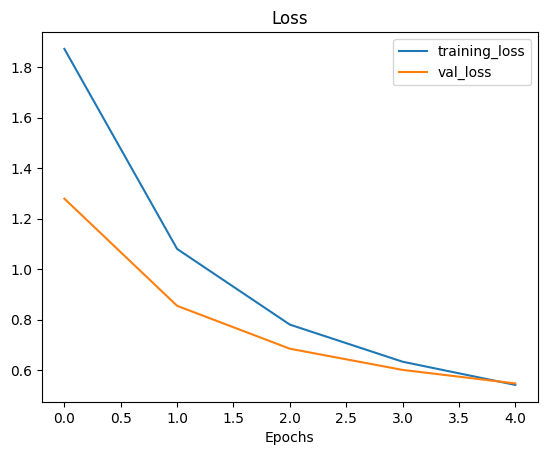

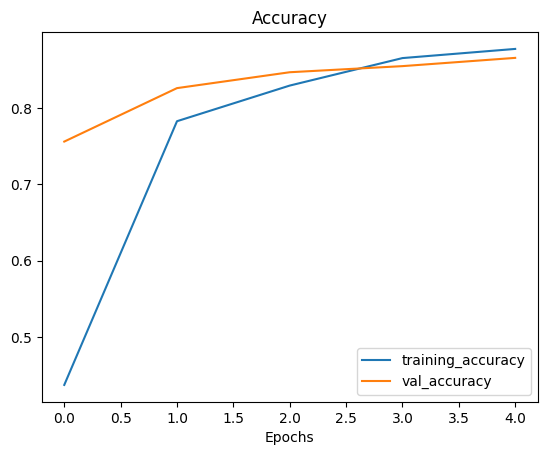

In [9]:
hf.plot_loss_curves(history_0)

### Make predictions.

1/1 [==============================] - 0s 23ms/step


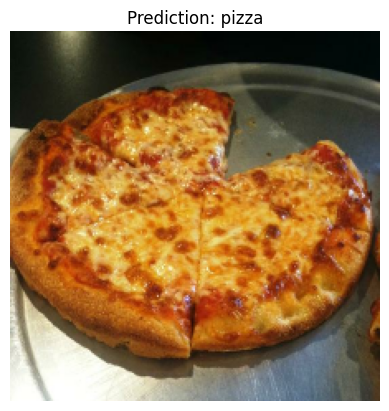

1/1 [==============================] - 0s 22ms/step


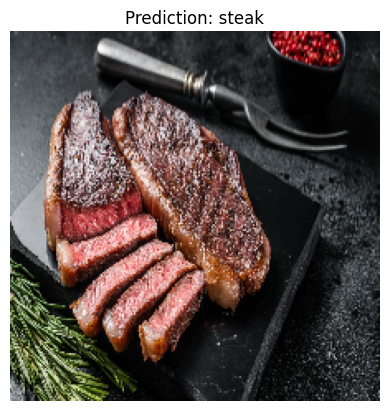

1/1 [==============================] - 0s 16ms/step


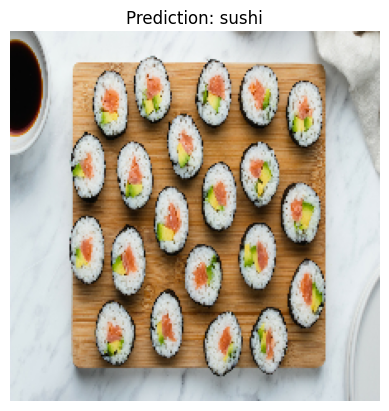

In [50]:
# Predict from external pictures.
model = model_0
hf.pred_and_plot(model, "images/pizza.jpg", class_names=class_names, scale=False)
hf.pred_and_plot(model, "images/steak.jpg", class_names=class_names, scale=False)
hf.pred_and_plot(model, "images/sushi.jpg", class_names=class_names, scale=False)

1/1 [==============================] - 0s 19ms/step


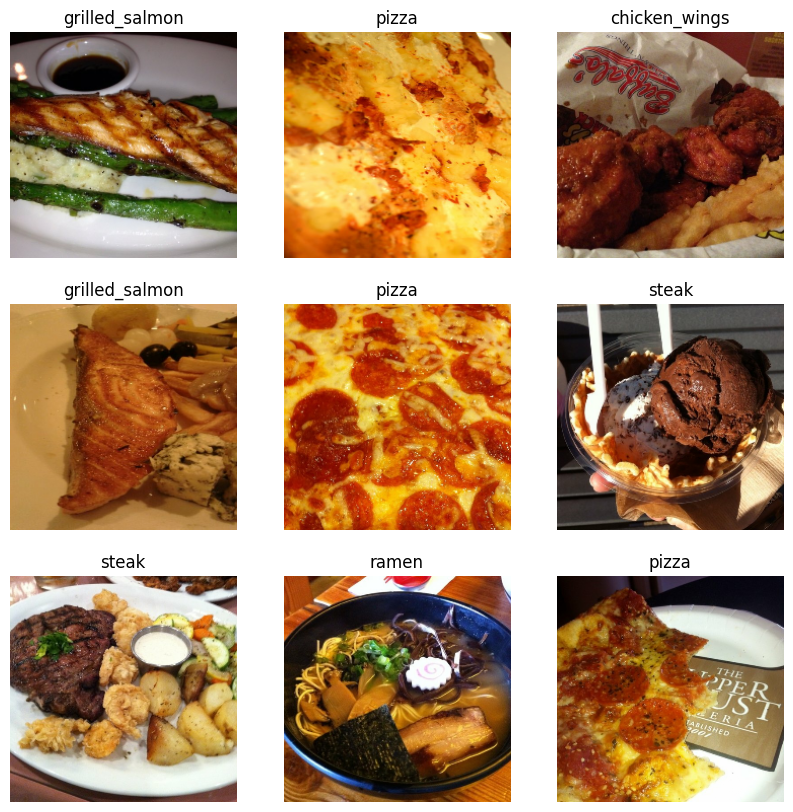

In [56]:
# Retrieve a batch of images from the test set and predict.
image_batch, label_batch = test_data.as_numpy_iterator().next()
class_names = test_data.class_names

plt.figure(figsize=(10, 10))
for i in range(9):
  img = image_batch[i]
  img = tf.image.resize(img, size=(224,224))

  pred = model_0.predict(tf.expand_dims(img, axis=0))
  pred_class = class_names[pred.argmax()]

  ax = plt.subplot(3, 3, i + 1)
  plt.imshow(img/255.)
  plt.title(pred_class)
  plt.axis("off")

### Confusion matrix.

79/79 [==============================] - 5s 59ms/step


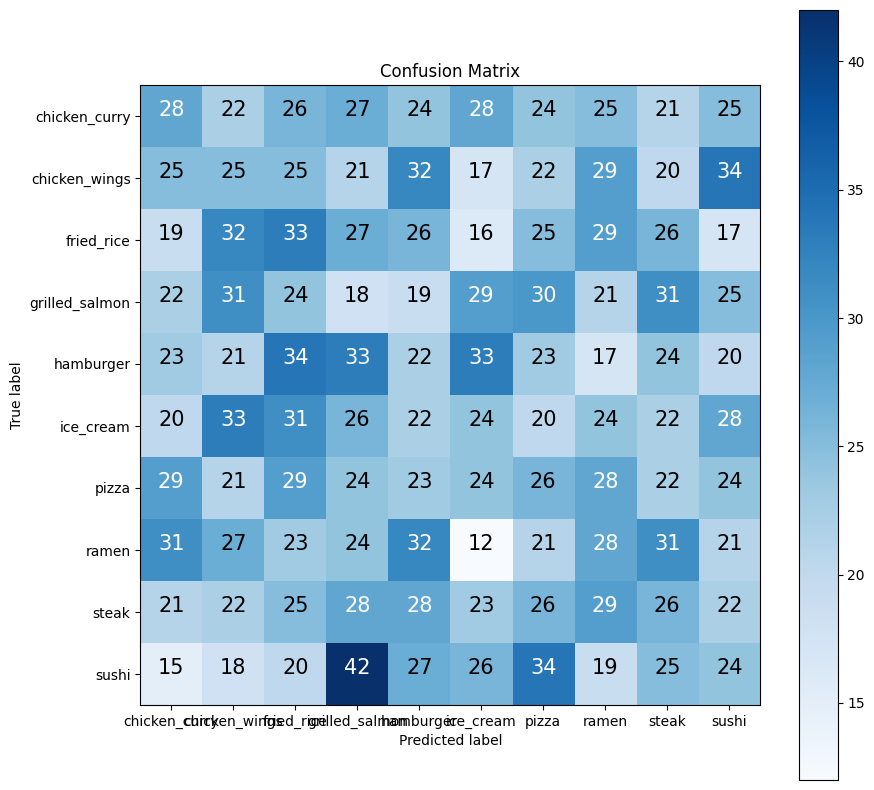

In [92]:
# Set model
model = model_0

# Get all ground truth labels from test set.
y_true = np.concatenate([y for x, y in test_data], axis=0)
y_true = tf.argmax(y_true, axis=1)
y_true.shape

# Predict on test set.
y_probs = model.predict(test_data)
y_preds = y_probs.argmax(axis=1)
y_preds.shape

# Plot confusion matrix.
hf.make_confusion_matrix(y_true=y_true,
                         y_pred=np.array(y_preds),
                         classes=class_names)

## `model_1` EfficientNetB0 baseline with feature extraction on 1% of training data with data augmentation.

### Data augmentation.

Non-augmented image.
['561431.jpg']
Image shape: (384, 512, 3)


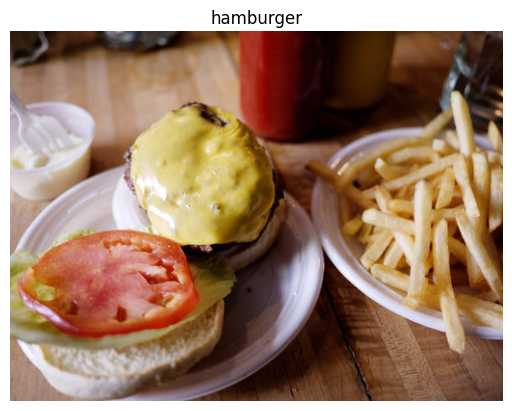

Augmented image.


(-0.5, 554.5, 430.5, -0.5)

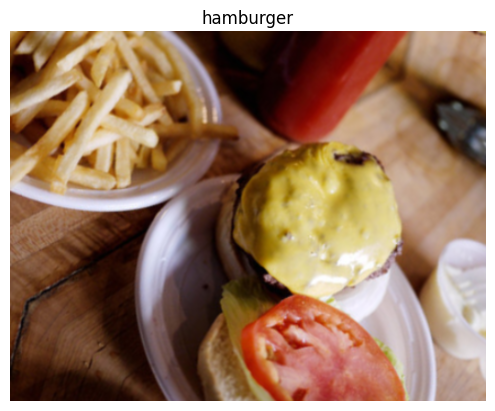

In [13]:
# Create data augmentation (you can add Functional layers out of Sequential ones).
"""
Using data augmentation as a Keras layer allows the model to use it with GPU 
acceleration while using the layer during training only.
"""
data_augmentation = tf.keras.Sequential([
    layers.RandomFlip("horizontal"),
    layers.RandomRotation(0.2),
    layers.RandomZoom(0.2),
    layers.RandomHeight(0.2),
    layers.RandomWidth(0.2)
    # layers.Rescaling(1./255)
], name="data_augmentation")

# Visualize.
print("Non-augmented image.")
target_class = random.choice(train_data_1_percent.class_names)
img = hf.view_random_image(train_dir_1_percent, target_class, i=1)

print("Augmented image.")
augmented_img = data_augmentation(img, training=True)
plt.imshow(augmented_img/255.)
plt.title(target_class)
plt.axis(False)

### Create the model.

In [14]:
# Setup input shape and base model.
input_shape = IMG_SIZE + (3,)
base_model = tf.keras.applications.EfficientNetB0(include_top=False)
base_model.trainable = False

# Create input layer.
inputs = layers.Input(shape=input_shape, name="input_layer")

# Add in data augmentation as a layer.
x = data_augmentation(inputs)

# Give base_model the augmented inputs but don't train it.
x = base_model(x, training=False)

# Pool output features.
x = layers.GlobalAveragePooling2D(name="global_average_pooling_layer")(x)

# Put a dense layer on as the output.
outputs = layers.Dense(10, activation="softmax", name="output_layer")(x)

# Create the model.
model_1 = tf.keras.Model(inputs, outputs)

# Compile the model.
model_1.compile(loss="categorical_crossentropy",
                optimizer=tf.keras.optimizers.Adam(),
                metrics=["accuracy"])

# Fit the model.
history_1 = model_1.fit(train_data_1_percent,
                        epochs=5,
                        steps_per_epoch=len(train_data_1_percent),
                        validation_data=test_data,
                        validation_steps=len(test_data),
                        callbacks=[hf.create_tensorboard_callback(dir_name="tensorboard_logs/04-TransferLearning-02-FineTuning",
                                                                  experiment_name="model_1"),
                                   hf.create_checkpoint_callback(dir_name="checkpoints/04-TransferLearning-02-FineTuning",
                                                                  experiment_name="model_1")])

# Check summary.
model_1.summary()

Saving TensorBoard log files to: tensorboard_logs/04-TransferLearning-02-FineTuning/model_1/20221219-124635
Saving checkpoint to: checkpoints/04-TransferLearning-02-FineTuning/model_1/checkpoint.ckpt
Epoch 1/5
3/3 [==============================] - ETA: 0s - loss: 2.3320 - accuracy: 0.0286WARNING:tensorflow:Model was constructed with shape (384, 512, 3) for input KerasTensor(type_spec=TensorSpec(shape=(384, 512, 3), dtype=tf.uint8, name='random_flip_input'), name='random_flip_input', description="created by layer 'random_flip_input'"), but it was called on an input with incompatible shape (None, 224, 224, 3).

Epoch 1: val_loss improved from inf to 2.23908, saving model to checkpoints/04-TransferLearning-02-FineTuning/model_1/checkpoint.ckpt
3/3 [==============================] - 10s 3s/step - loss: 2.3320 - accuracy: 0.0286 - val_loss: 2.2391 - val_accuracy: 0.1460
Epoch 2/5
3/3 [==============================] - ETA: 0s - loss: 2.0521 - accuracy: 0.2000
Epoch 2: val_loss improved fro

### Evaluate the model.

In [15]:
eval_1 = model_1.evaluate(test_data)

79/79 [==============================] - 4s 54ms/step - loss: 1.8066 - accuracy: 0.5048


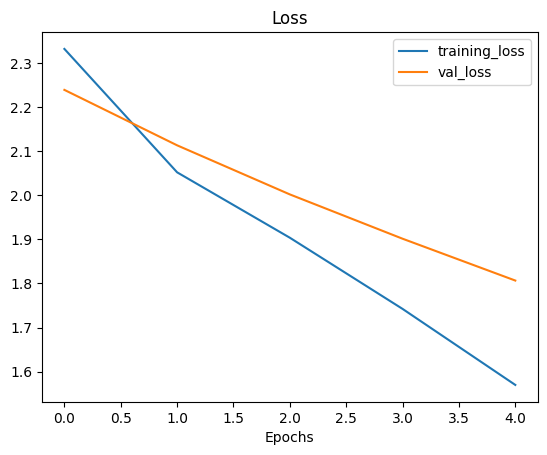

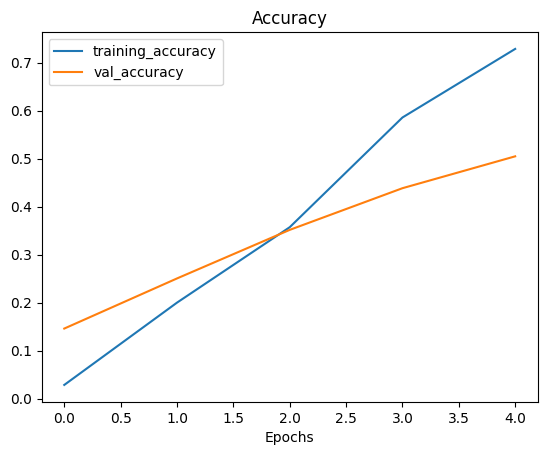

In [16]:
hf.plot_loss_curves(history_1)

### Make predictions.

1/1 [==============================] - 0s 20ms/step


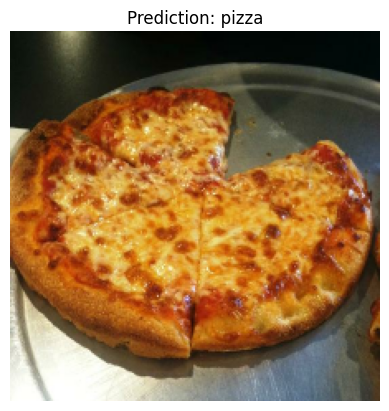

1/1 [==============================] - 0s 22ms/step


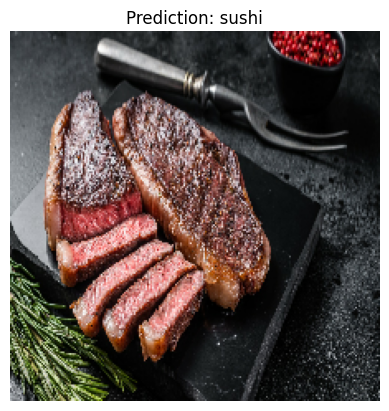

1/1 [==============================] - 0s 18ms/step


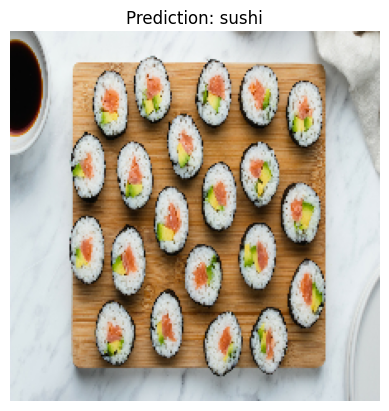

In [51]:
# Predict from external pictures.
model = model_1
hf.pred_and_plot(model, "images/pizza.jpg", class_names=class_names, scale=False)
hf.pred_and_plot(model, "images/steak.jpg", class_names=class_names, scale=False)
hf.pred_and_plot(model, "images/sushi.jpg", class_names=class_names, scale=False)

1/1 [==============================] - 0s 21ms/step


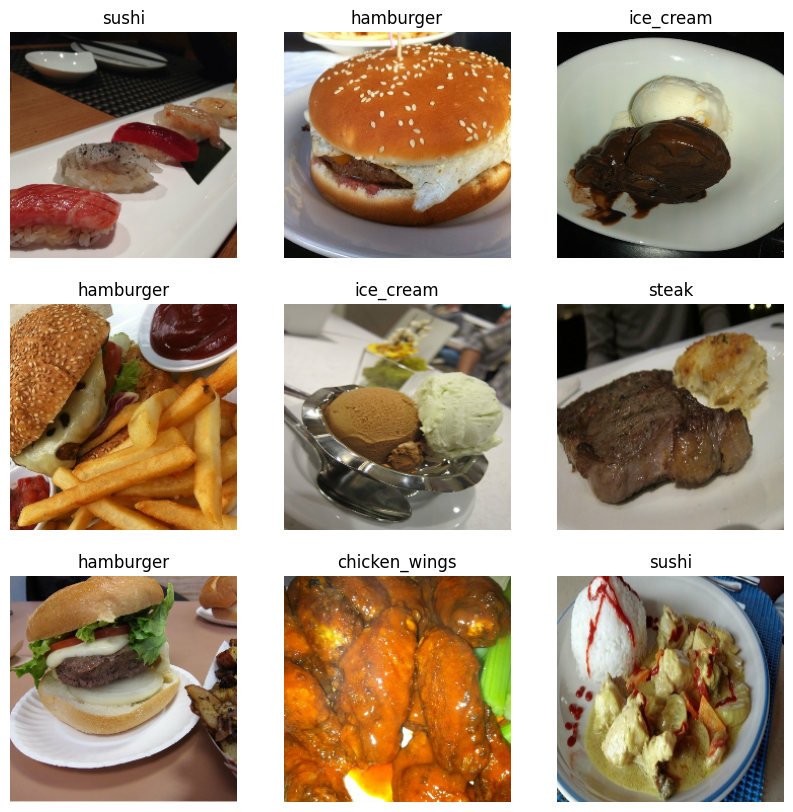

In [54]:
# Retrieve a batch of images from the test set and predict.
image_batch, label_batch = test_data.as_numpy_iterator().next()
class_names = test_data.class_names

plt.figure(figsize=(10, 10))
for i in range(9):
  img = image_batch[i]
  img = tf.image.resize(img, size=(224,224))

  pred = model_1.predict(tf.expand_dims(img, axis=0))
  pred_class = class_names[pred.argmax()]

  ax = plt.subplot(3, 3, i + 1)
  plt.imshow(img/255.)
  plt.title(pred_class)
  plt.axis("off")

### Confusion matrix.

79/79 [==============================] - 5s 58ms/step


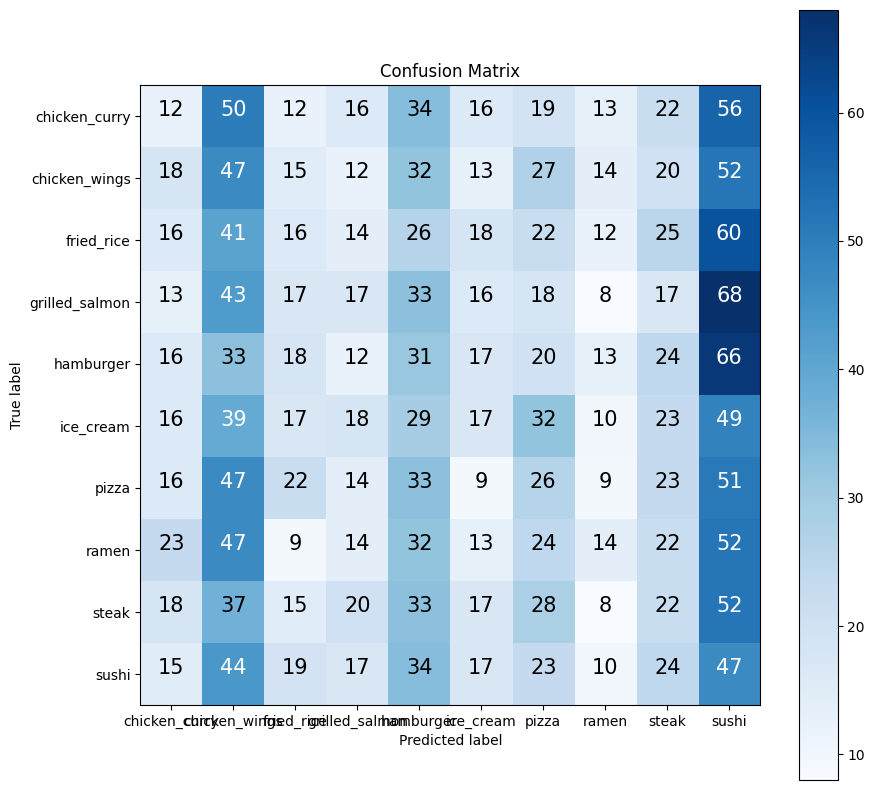

In [93]:
# Set model
model = model_1

# Get all ground truth labels from test set.
y_true = np.concatenate([y for x, y in test_data], axis=0)
y_true = tf.argmax(y_true, axis=1)
y_true.shape

# Predict on test set.
y_probs = model.predict(test_data)
y_preds = y_probs.argmax(axis=1)
y_preds.shape

# Plot confusion matrix.
hf.make_confusion_matrix(y_true=y_true,
                         y_pred=np.array(y_preds),
                         classes=class_names)

## `model_2` EfficientNetB0 baseline with feature extraction on 10% of training data with data augmentation.

### Data augmentation.

In [23]:
# Same as model_1.
data_augmentation.summary()

Model: "data_augmentation"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 random_flip (RandomFlip)    (384, 512, 3)             0         
                                                                 
 random_rotation (RandomRota  (384, 512, 3)            0         
 tion)                                                           
                                                                 
 random_zoom (RandomZoom)    (384, 512, 3)             0         
                                                                 
 random_height (RandomHeight  (None, 512, 3)           0         
 )                                                               
                                                                 
 random_width (RandomWidth)  (None, None, 3)           0         
                                                                 
Total params: 0
Trainable params: 0
Non-trainable

### Create the model.

In [24]:
# Set up input shape and frozen base model (or backbone).
input_shape = IMG_SIZE + (3,)
base_model = tf.keras.applications.EfficientNetB0(include_top=False)
base_model.trainable =  False

# Create layers.
inputs = layers.Input(shape=input_shape, name="input_layer")
x = data_augmentation(inputs)
x = base_model(x, training=False)
x = layers.GlobalAveragePooling2D(name="global_average_pooling_2D")(x)
outputs = layers.Dense(10, activation="softmax", name="outout_layer")(x)

# Create model.
model_2 = tf.keras.Model(inputs, outputs)

# Compile model.
model_2.compile(loss="categorical_crossentropy",
                optimizer=tf.keras.optimizers.Adam(),
                metrics=["accuracy"])

# Fit model.
history_2 = model_2.fit(train_data_10_percent,
                        epochs=5,
                        steps_per_epoch=len(train_data_10_percent),
                        validation_data=test_data,
                        validation_steps=len(test_data),
                        callbacks=[hf.create_tensorboard_callback(dir_name="tensorboard_logs/04-TransferLearning-02-FineTuning",
                                                                  experiment_name="model_2"),
                                   hf.create_checkpoint_callback(dir_name="checkpoints/04-TransferLearning-02-FineTuning",
                                                                  experiment_name="model_2")])

# Get summary.
model_2.summary()

Saving TensorBoard log files to: tensorboard_logs/04-TransferLearning-02-FineTuning/model_2/20221219-124800
Saving checkpoint to: checkpoints/04-TransferLearning-02-FineTuning/model_2/checkpoint.ckpt
Epoch 1/5
24/24 [==============================] - ETA: 0s - loss: 1.9739 - accuracy: 0.4080WARNING:tensorflow:Model was constructed with shape (384, 512, 3) for input KerasTensor(type_spec=TensorSpec(shape=(384, 512, 3), dtype=tf.uint8, name='random_flip_input'), name='random_flip_input', description="created by layer 'random_flip_input'"), but it was called on an input with incompatible shape (None, 224, 224, 3).

Epoch 1: val_loss improved from inf to 1.43138, saving model to checkpoints/04-TransferLearning-02-FineTuning/model_2/checkpoint.ckpt
24/24 [==============================] - 16s 533ms/step - loss: 1.9739 - accuracy: 0.4080 - val_loss: 1.4314 - val_accuracy: 0.6816
Epoch 2/5
24/24 [==============================] - ETA: 0s - loss: 1.3097 - accuracy: 0.6893
Epoch 2: val_loss imp

### Evaluate model.

In [25]:
eval_2 = model_2.evaluate(test_data)

79/79 [==============================] - 5s 60ms/step - loss: 0.6321 - accuracy: 0.8356


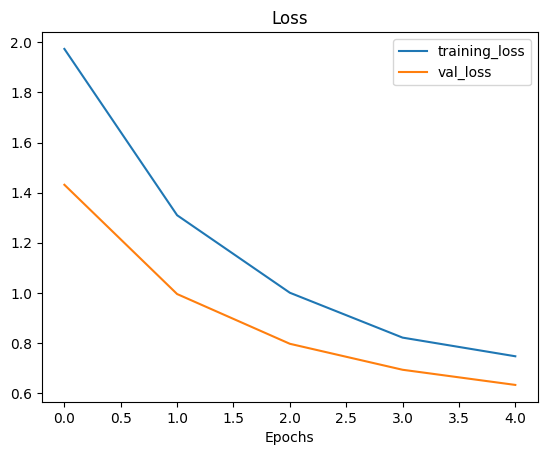

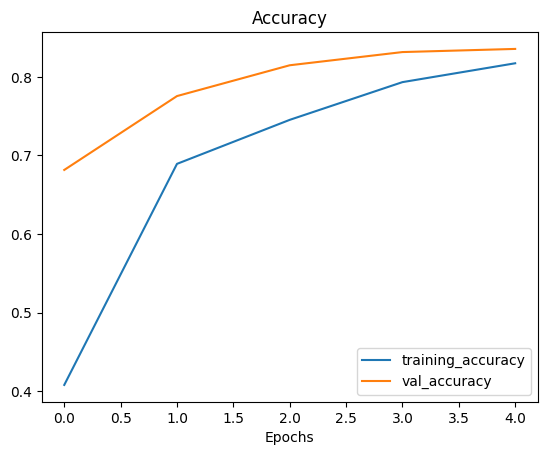

In [26]:
hf.plot_loss_curves(history_2)

### Load in checkpointed weights.

In [27]:
checkpoint_path = "checkpoints/04-TransferLearning-02-FineTuning/model_2/checkpoint.ckpt"
model_2.load_weights(checkpoint_path)
eval_2_loaded = model_2.evaluate(test_data)

79/79 [==============================] - 4s 55ms/step - loss: 0.6321 - accuracy: 0.8356


In [36]:
# Not exactly equal because storage precision issues.
eval_2, eval_2_loaded, eval_2 == eval_2_loaded

([0.6320705413818359, 0.8356000185012817],
 [0.6320704817771912, 0.8356000185012817],
 False)

In [35]:
np.isclose(eval_2, eval_2_loaded)

array([ True,  True])

### Make predictions.

1/1 [==============================] - 0s 23ms/step


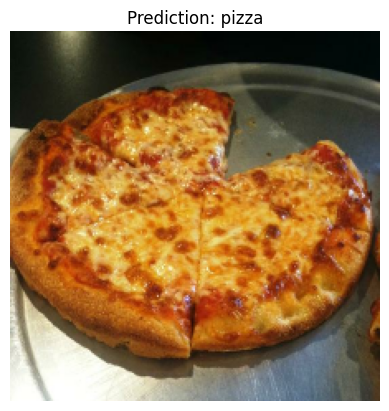

1/1 [==============================] - 0s 21ms/step


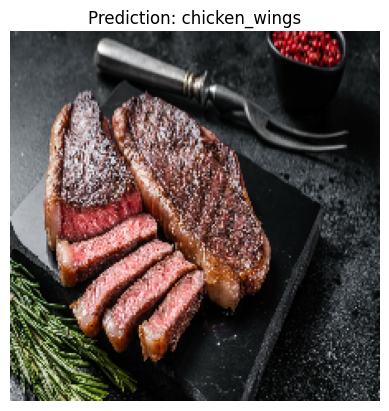

1/1 [==============================] - 0s 18ms/step


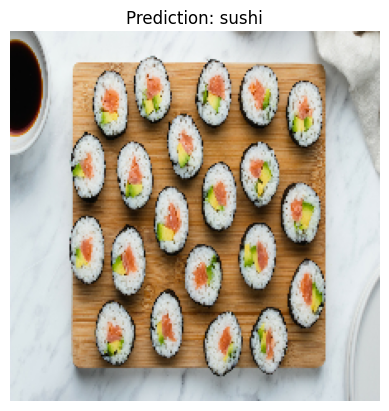

In [52]:
# Predict from external pictures.
model = model_2
hf.pred_and_plot(model, "images/pizza.jpg", class_names=class_names, scale=False)
hf.pred_and_plot(model, "images/steak.jpg", class_names=class_names, scale=False)
hf.pred_and_plot(model, "images/sushi.jpg", class_names=class_names, scale=False)

1/1 [==============================] - 0s 15ms/step


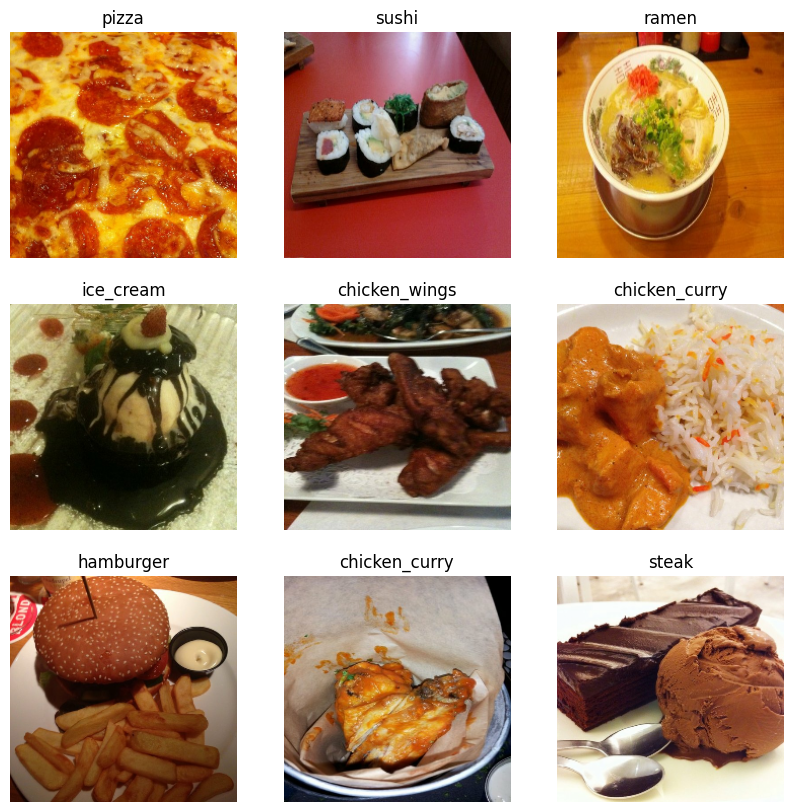

In [53]:
# Retrieve a batch of images from the test set and predict.
image_batch, label_batch = test_data.as_numpy_iterator().next()
class_names = test_data.class_names

plt.figure(figsize=(10, 10))
for i in range(9):
  img = image_batch[i]
  img = tf.image.resize(img, size=(224,224))

  pred = model_2.predict(tf.expand_dims(img, axis=0))
  pred_class = class_names[pred.argmax()]

  ax = plt.subplot(3, 3, i + 1)
  plt.imshow(img/255.)
  plt.title(pred_class)
  plt.axis("off")

### Confusion matrix.

79/79 [==============================] - 5s 56ms/step


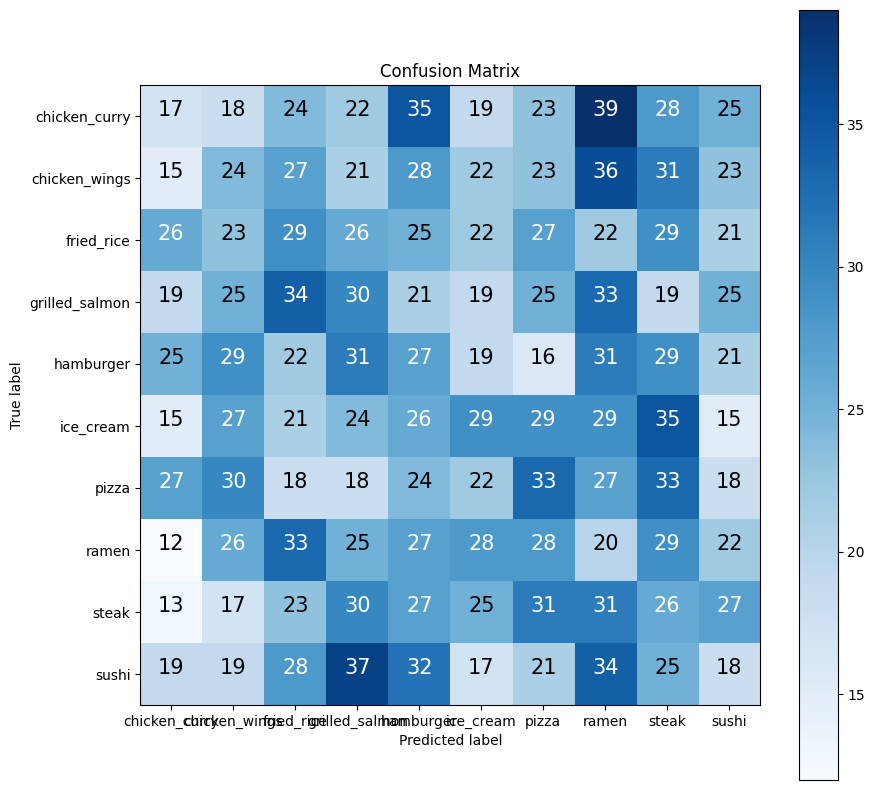

In [94]:
# Set model
model = model_2

# Get all ground truth labels from test set.
y_true = np.concatenate([y for x, y in test_data], axis=0)
y_true = tf.argmax(y_true, axis=1)
y_true.shape

# Predict on test set.
y_probs = model.predict(test_data)
y_preds = y_probs.argmax(axis=1)
y_preds.shape

# Plot confusion matrix.
hf.make_confusion_matrix(y_true=y_true,
                         y_pred=np.array(y_preds),
                         classes=class_names)

## `model_3` EfficientNetB0 baseline with fine tuning on 10% of training data with data augmentation.

### Data augmentation.

In [37]:
# Same as model_1
data_augmentation.summary()

Model: "data_augmentation"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 random_flip (RandomFlip)    (384, 512, 3)             0         
                                                                 
 random_rotation (RandomRota  (384, 512, 3)            0         
 tion)                                                           
                                                                 
 random_zoom (RandomZoom)    (384, 512, 3)             0         
                                                                 
 random_height (RandomHeight  (None, 512, 3)           0         
 )                                                               
                                                                 
 random_width (RandomWidth)  (None, None, 3)           0         
                                                                 
Total params: 0
Trainable params: 0
Non-trainable

### Create model.
Fine tuning on the last 10 layers.

In [38]:
# Set up input shape and frozen base model (or backbone).
input_shape = IMG_SIZE + (3,)
base_model = tf.keras.applications.EfficientNetB0(include_top=False)
base_model.trainable =  False

# Create layers.
inputs = layers.Input(shape=input_shape, name="input_layer")
x = data_augmentation(inputs)
x = base_model(x, training=False)
x = layers.GlobalAveragePooling2D(name="global_average_pooling_2D")(x)
outputs = layers.Dense(10, activation="softmax", name="outout_layer")(x)

# Create model.
model_3 = tf.keras.Model(inputs, outputs)

# Compile model.
model_3.compile(loss="categorical_crossentropy",
                optimizer=tf.keras.optimizers.Adam(),
                metrics=["accuracy"])

# Fit model.
initial_epochs = 5
history_3 = model_3.fit(train_data_10_percent,
                        epochs=initial_epochs,
                        steps_per_epoch=len(train_data_10_percent),
                        validation_data=test_data,
                        validation_steps=len(test_data),
                        callbacks=[hf.create_tensorboard_callback(dir_name="tensorboard_logs/04-TransferLearning-02-FineTuning",
                                                                  experiment_name="model_3"),
                                   hf.create_checkpoint_callback(dir_name="checkpoints/04-TransferLearning-02-FineTuning",
                                                                  experiment_name="model_3")])

# Get summary.
model_3.summary()

# Freeze all layers except for the last 10.
fine_tune_at = 10
base_model.trainable = True
for layer in base_model.layers[:-fine_tune_at]:
  layer.trainable = False

# Compile model.
model_3.compile(loss="categorical_crossentropy",
                optimizer=tf.keras.optimizers.Adam(lr=0.0001), # Lowering LR by 10x is recommended in fine tuning to avoid overfitting.
                metrics=["accuracy"])

# Fit model.
fine_tune_epochs = 5
total_epochs =  initial_epochs + fine_tune_epochs

history_3_fined = model_3.fit(train_data_10_percent,
                        epochs=total_epochs,
                        steps_per_epoch=len(train_data_10_percent),
                        validation_data=test_data,
                        validation_steps=len(test_data),
                        initial_epoch=history_3.epoch[-1],
                        callbacks=[hf.create_tensorboard_callback(dir_name="tensorboard_logs/04-TransferLearning-02-FineTuning",
                                                                  experiment_name="model_3_fined"),
                                   hf.create_checkpoint_callback(dir_name="checkpoints/04-TransferLearning-02-FineTuning",
                                                                  experiment_name="model_3_fined")])

# Get summary.
model_3.summary()

Saving TensorBoard log files to: tensorboard_logs/04-TransferLearning-02-FineTuning/model_3/20221219-125121
Saving checkpoint to: checkpoints/04-TransferLearning-02-FineTuning/model_3/checkpoint.ckpt
Epoch 1/5
24/24 [==============================] - ETA: 0s - loss: 1.9442 - accuracy: 0.3493WARNING:tensorflow:Model was constructed with shape (384, 512, 3) for input KerasTensor(type_spec=TensorSpec(shape=(384, 512, 3), dtype=tf.uint8, name='random_flip_input'), name='random_flip_input', description="created by layer 'random_flip_input'"), but it was called on an input with incompatible shape (None, 224, 224, 3).

Epoch 1: val_loss improved from inf to 1.36169, saving model to checkpoints/04-TransferLearning-02-FineTuning/model_3/checkpoint.ckpt
24/24 [==============================] - 14s 467ms/step - loss: 1.9442 - accuracy: 0.3493 - val_loss: 1.3617 - val_accuracy: 0.7060
Epoch 2/5
24/24 [==============================] - ETA: 0s - loss: 1.2800 - accuracy: 0.7027
Epoch 2: val_loss imp

/home/santiagorg2401/anaconda3/envs/tf/lib/python3.9/site-packages/keras/optimizers/optimizer_v2/adam.py:110: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


24/24 [==============================] - ETA: 0s - loss: 0.5893 - accuracy: 0.8467WARNING:tensorflow:Model was constructed with shape (384, 512, 3) for input KerasTensor(type_spec=TensorSpec(shape=(384, 512, 3), dtype=tf.uint8, name='random_flip_input'), name='random_flip_input', description="created by layer 'random_flip_input'"), but it was called on an input with incompatible shape (None, 224, 224, 3).

Epoch 5: val_loss improved from inf to 0.48780, saving model to checkpoints/04-TransferLearning-02-FineTuning/model_3_fined/checkpoint.ckpt
24/24 [==============================] - 15s 466ms/step - loss: 0.5893 - accuracy: 0.8467 - val_loss: 0.4878 - val_accuracy: 0.8508
Epoch 6/10
24/24 [==============================] - ETA: 0s - loss: 0.4818 - accuracy: 0.8520
Epoch 6: val_loss improved from 0.48780 to 0.44718, saving model to checkpoints/04-TransferLearning-02-FineTuning/model_3_fined/checkpoint.ckpt
24/24 [==============================] - 9s 394ms/step - loss: 0.4818 - accuracy

### Evaluate model.

In [39]:
eval_3 = model_3.evaluate(test_data)

79/79 [==============================] - 5s 60ms/step - loss: 0.4312 - accuracy: 0.8592


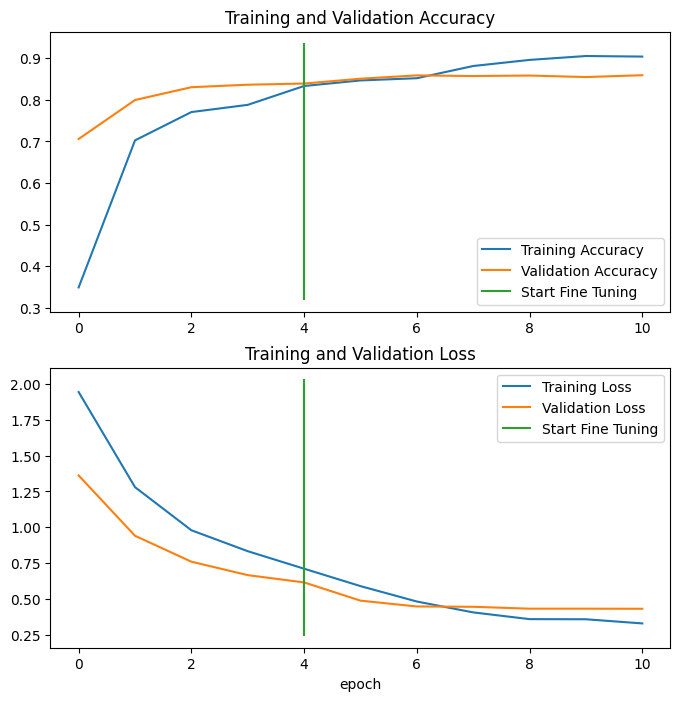

In [40]:
hf.compare_historys(history_3, history_3_fined, initial_epochs=initial_epochs)

### Make predictions.

1/1 [==============================] - 0s 20ms/step


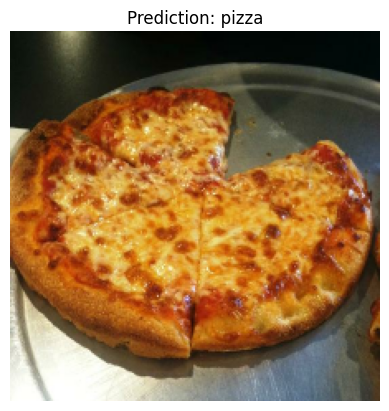

1/1 [==============================] - 0s 24ms/step


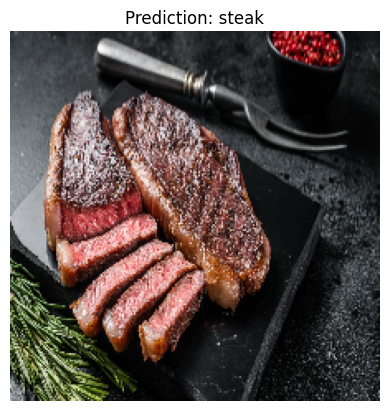

1/1 [==============================] - 0s 19ms/step


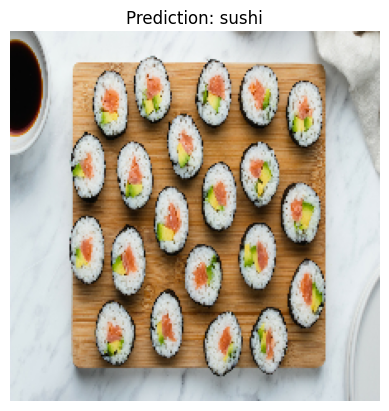

In [49]:
# Predict from external pictures.
model = model_3
hf.pred_and_plot(model, "images/pizza.jpg", class_names=class_names, scale=False)
hf.pred_and_plot(model, "images/steak.jpg", class_names=class_names, scale=False)
hf.pred_and_plot(model, "images/sushi.jpg", class_names=class_names, scale=False)

1/1 [==============================] - 0s 21ms/step


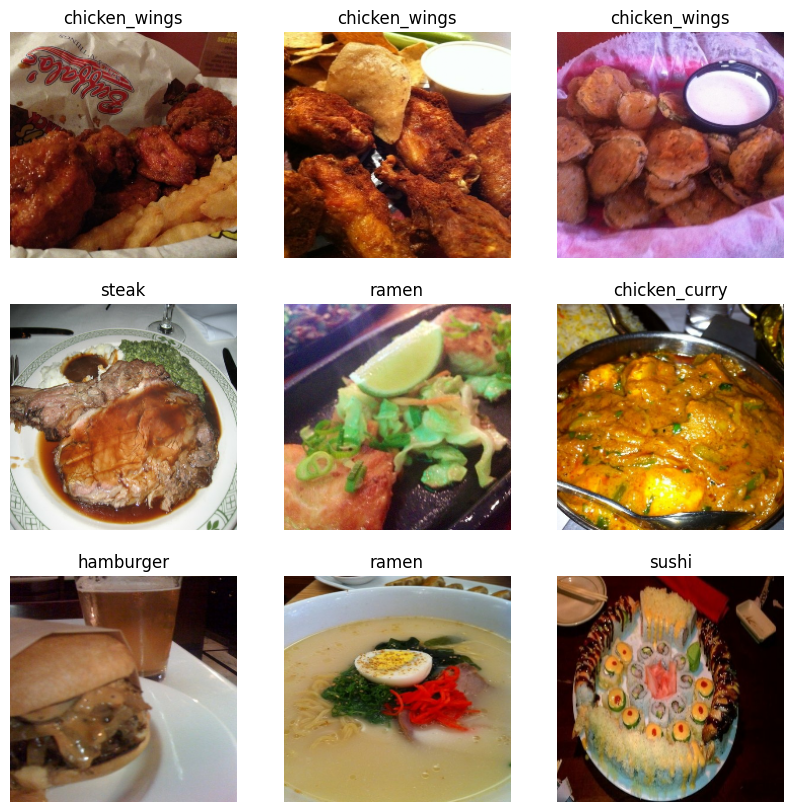

In [48]:
# Retrieve a batch of images from the test set and predict.
image_batch, label_batch = test_data.as_numpy_iterator().next()
class_names = test_data.class_names

plt.figure(figsize=(10, 10))
for i in range(9):
  img = image_batch[i]
  img = tf.image.resize(img, size=(224,224))

  pred = model_3.predict(tf.expand_dims(img, axis=0))
  pred_class = class_names[pred.argmax()]

  ax = plt.subplot(3, 3, i + 1)
  plt.imshow(img/255.)
  plt.title(pred_class)
  plt.axis("off")

### Confusion matrix.

79/79 [==============================] - 5s 53ms/step


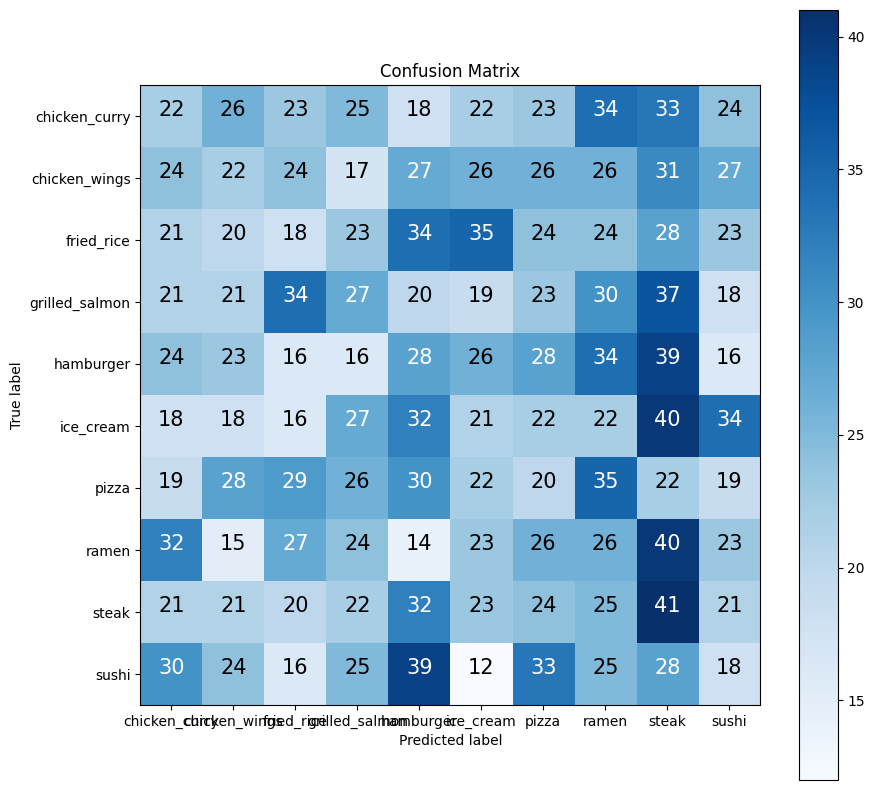

In [95]:
# Set model
model = model_3

# Get all ground truth labels from test set.
y_true = np.concatenate([y for x, y in test_data], axis=0)
y_true = tf.argmax(y_true, axis=1)
y_true.shape

# Predict on test set.
y_probs = model.predict(test_data)
y_preds = y_probs.argmax(axis=1)
y_preds.shape

# Plot confusion matrix.
hf.make_confusion_matrix(y_true=y_true,
                         y_pred=np.array(y_preds),
                         classes=class_names)

## `model_4` EfficientNetB0 baseline with feature extraction on 100% of training data with data augmentation.

### Data augmentation.

In [98]:
# Same as model_1
data_augmentation.summary()

Model: "data_augmentation"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 random_flip (RandomFlip)    (384, 512, 3)             0         
                                                                 
 random_rotation (RandomRota  (384, 512, 3)            0         
 tion)                                                           
                                                                 
 random_zoom (RandomZoom)    (384, 512, 3)             0         
                                                                 
 random_height (RandomHeight  (None, 512, 3)           0         
 )                                                               
                                                                 
 random_width (RandomWidth)  (None, None, 3)           0         
                                                                 
Total params: 0
Trainable params: 0
Non-trainable

### Create model.

In [100]:
# Set up input shape and frozen  base model.
input_shape = IMG_SIZE + (3,)
base_model = tf.keras.applications.EfficientNetB0(include_top=False)
base_model.trainable = False

# Create layers.
inputs = layers.Input(shape=input_shape, name="input_shape")
x = data_augmentation(inputs)
x = base_model(x, training=False)
x = layers.GlobalAveragePooling2D(name="global_average_pooling_2D")(x)
outputs = layers.Dense(10, activation="softmax", name = "output_layer")(x)

# Create model.
model_4 = tf.keras.Model(inputs, outputs)

# Compile model.
model_4.compile(loss="categorical_crossentropy",
                optimizer=tf.keras.optimizers.Adam(),
                metrics=["accuracy"])

# Fit model.
initial_epochs = 5
history_4 = model_4.fit(train_data_all_data,
                        epochs=initial_epochs,
                        steps_per_epoch=len(train_data_all_data),
                        validation_data=test_data,
                        validation_steps=len(test_data),
                        callbacks=[hf.create_tensorboard_callback(dir_name="tensorboard_logs/04-TransferLearning-02-FineTuning",
                                                                 experiment_name="model_4"),
                                   hf.create_checkpoint_callback(dir_name="checkpoints/04-TransferLearning-02-FineTuning",
                                                                 experiment_name="model_4")])

# Get summary.
model_4.summary()

# Freeze all layers except for last 10.
fine_tune_at = 10
base_model.trainable = True
for layer in base_model.layers[:fine_tune_at]:
  layer.trainable = False

# Compile model.
model_4.compile(loss="categorical_crossentropy",
                optimizer=tf.keras.optimizers.Adam(lr=0.0001),
                metrics=["accuracy"])

# Fit model.
fine_tune_epochs = 5
total_epochs = initial_epochs + fine_tune_epochs

history_4_fine = model_4.fit(train_data_all_data,
                              epochs=total_epochs,
                              initial_epoch=history_4.epoch[-1],
                              steps_per_epoch=len(train_data_all_data),
                              validation_data=test_data,
                              validation_steps=len(test_data),
                              callbacks=[hf.create_tensorboard_callback(dir_name="tensorboard_logs/04-TransferLearning-02-FineTuning",
                                                                        experiment_name="model_4_fine"),
                                         hf.create_checkpoint_callback(dir_name="checkpoints/04-TransferLearning-02-FineTuning",
                                                                       experiment_name="model_4_fine")])
# Get summary.
model_4.summary()

Saving TensorBoard log files to: tensorboard_logs/04-TransferLearning-02-FineTuning/model_4/20221219-140658
Saving checkpoint to: checkpoints/04-TransferLearning-02-FineTuning/model_4/checkpoint.ckpt
Epoch 1/5
235/235 [==============================] - ETA: 0s - loss: 0.9935 - accuracy: 0.7132WARNING:tensorflow:Model was constructed with shape (384, 512, 3) for input KerasTensor(type_spec=TensorSpec(shape=(384, 512, 3), dtype=tf.uint8, name='random_flip_input'), name='random_flip_input', description="created by layer 'random_flip_input'"), but it was called on an input with incompatible shape (None, 224, 224, 3).

Epoch 1: val_loss improved from inf to 0.45914, saving model to checkpoints/04-TransferLearning-02-FineTuning/model_4/checkpoint.ckpt
235/235 [==============================] - 51s 197ms/step - loss: 0.9935 - accuracy: 0.7132 - val_loss: 0.4591 - val_accuracy: 0.8664
Epoch 2/5
235/235 [==============================] - ETA: 0s - loss: 0.6126 - accuracy: 0.8105
Epoch 2: val_lo

/home/santiagorg2401/anaconda3/envs/tf/lib/python3.9/site-packages/keras/optimizers/optimizer_v2/adam.py:110: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


 49/235 [=====>........................] - ETA: 2:03 - loss: 0.4759 - accuracy: 0.8444

2022-12-19 14:10:58.508513: W tensorflow/core/common_runtime/bfc_allocator.cc:290] Allocator (GPU_0_bfc) ran out of memory trying to allocate 583.84MiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.
2022-12-19 14:10:58.508742: W tensorflow/core/common_runtime/bfc_allocator.cc:290] Allocator (GPU_0_bfc) ran out of memory trying to allocate 583.84MiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.


117/235 [=============>................] - ETA: 1:13 - loss: 0.4454 - accuracy: 0.8574

2022-12-19 14:11:38.153027: W tensorflow/core/common_runtime/bfc_allocator.cc:290] Allocator (GPU_0_bfc) ran out of memory trying to allocate 2.28GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.
2022-12-19 14:11:38.153062: W tensorflow/core/common_runtime/bfc_allocator.cc:290] Allocator (GPU_0_bfc) ran out of memory trying to allocate 2.28GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.


150/235 [==================>...........] - ETA: 51s - loss: 0.4343 - accuracy: 0.8612

2022-12-19 14:11:55.675137: W tensorflow/core/common_runtime/bfc_allocator.cc:290] Allocator (GPU_0_bfc) ran out of memory trying to allocate 2.28GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.
2022-12-19 14:11:55.675175: W tensorflow/core/common_runtime/bfc_allocator.cc:290] Allocator (GPU_0_bfc) ran out of memory trying to allocate 2.28GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.


161/235 [===================>..........] - ETA: 43s - loss: 0.4365 - accuracy: 0.8608

2022-12-19 14:12:00.949237: W tensorflow/core/common_runtime/bfc_allocator.cc:290] Allocator (GPU_0_bfc) ran out of memory trying to allocate 2.28GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.
2022-12-19 14:12:00.949352: W tensorflow/core/common_runtime/bfc_allocator.cc:290] Allocator (GPU_0_bfc) ran out of memory trying to allocate 2.28GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.


217/235 [==========================>...] - ETA: 10s - loss: 0.4389 - accuracy: 0.8600

2022-12-19 14:12:33.085265: W tensorflow/core/common_runtime/bfc_allocator.cc:290] Allocator (GPU_0_bfc) ran out of memory trying to allocate 2.28GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.
2022-12-19 14:12:33.085304: W tensorflow/core/common_runtime/bfc_allocator.cc:290] Allocator (GPU_0_bfc) ran out of memory trying to allocate 2.28GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.


235/235 [==============================] - ETA: 0s - loss: 0.4377 - accuracy: 0.8592WARNING:tensorflow:Model was constructed with shape (384, 512, 3) for input KerasTensor(type_spec=TensorSpec(shape=(384, 512, 3), dtype=tf.uint8, name='random_flip_input'), name='random_flip_input', description="created by layer 'random_flip_input'"), but it was called on an input with incompatible shape (None, 224, 224, 3).

Epoch 5: val_loss improved from inf to 0.28629, saving model to checkpoints/04-TransferLearning-02-FineTuning/model_4_fine/checkpoint.ckpt
235/235 [==============================] - 148s 605ms/step - loss: 0.4377 - accuracy: 0.8592 - val_loss: 0.2863 - val_accuracy: 0.9044
Epoch 6/10
235/235 [==============================] - ETA: 0s - loss: 0.2985 - accuracy: 0.9039
Epoch 6: val_loss improved from 0.28629 to 0.23647, saving model to checkpoints/04-TransferLearning-02-FineTuning/model_4_fine/checkpoint.ckpt
235/235 [==============================] - 114s 484ms/step - loss: 0.2985 -

### Evaluate model.

In [101]:
eval_4 = model_4.evaluate(test_data)

79/79 [==============================] - 5s 61ms/step - loss: 0.2640 - accuracy: 0.9308


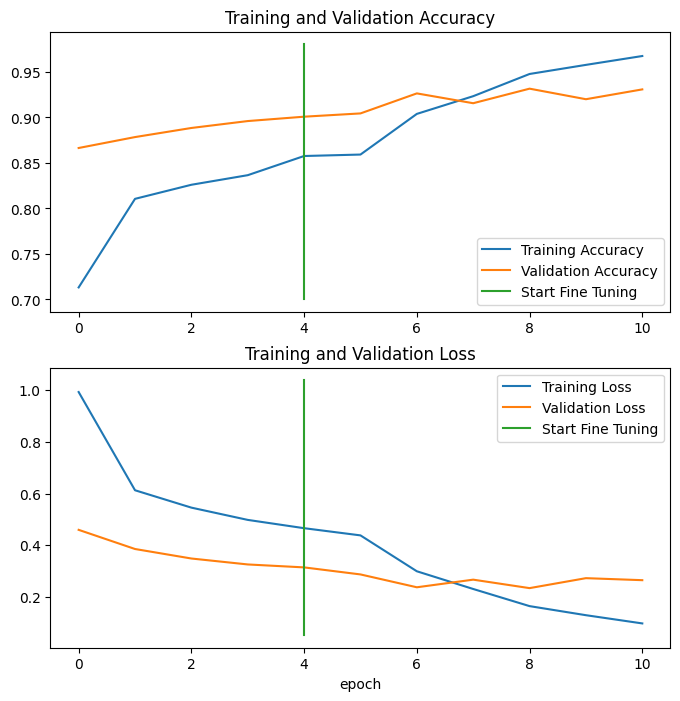

In [103]:
hf.compare_historys(history_4, history_4_fine)

### Make predictions.

1/1 [==============================] - 1s 721ms/step


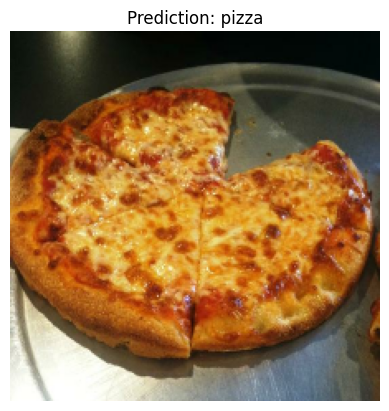

1/1 [==============================] - 0s 23ms/step


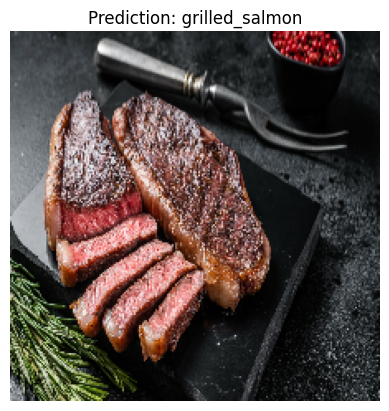

1/1 [==============================] - 0s 26ms/step


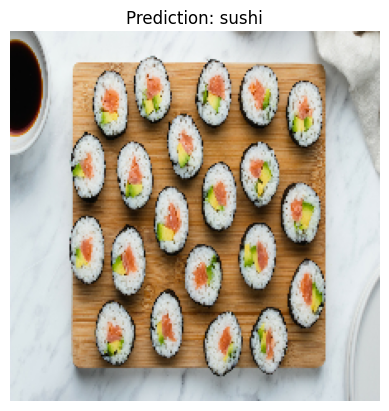

In [104]:
# Predict from external pictures.
model = model_4
hf.pred_and_plot(model, "images/pizza.jpg", class_names=class_names, scale=False)
hf.pred_and_plot(model, "images/steak.jpg", class_names=class_names, scale=False)
hf.pred_and_plot(model, "images/sushi.jpg", class_names=class_names, scale=False)

1/1 [==============================] - 0s 15ms/step


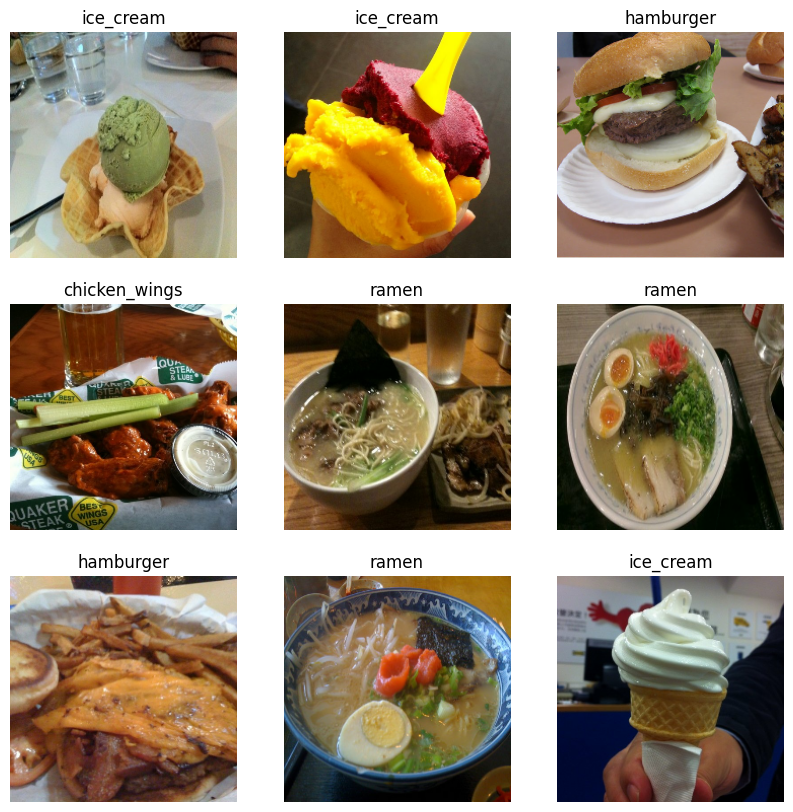

In [105]:
# Retrieve a batch of images from the test set and predict.
image_batch, label_batch = test_data.as_numpy_iterator().next()
class_names = test_data.class_names

plt.figure(figsize=(10, 10))
for i in range(9):
  img = image_batch[i]
  img = tf.image.resize(img, size=(224,224))

  pred = model_4.predict(tf.expand_dims(img, axis=0))
  pred_class = class_names[pred.argmax()]

  ax = plt.subplot(3, 3, i + 1)
  plt.imshow(img/255.)
  plt.title(pred_class)
  plt.axis("off")

### Confusion matrix.

79/79 [==============================] - 6s 58ms/step


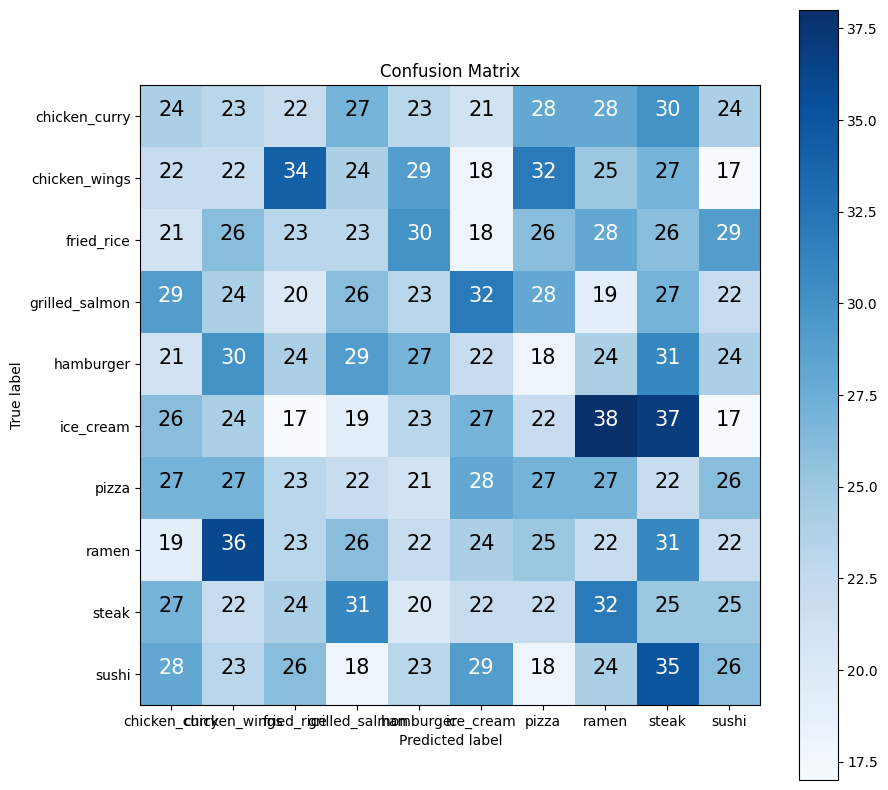

In [106]:
# Set model
model = model_4

# Get all ground truth labels from test set.
y_true = np.concatenate([y for x, y in test_data], axis=0)
y_true = tf.argmax(y_true, axis=1)
y_true.shape

# Predict on test set.
y_probs = model.predict(test_data)
y_preds = y_probs.argmax(axis=1)
y_preds.shape

# Plot confusion matrix.
hf.make_confusion_matrix(y_true=y_true,
                         y_pred=np.array(y_preds),
                         classes=class_names)

## Compare model results with TensorBoard.
Upload made locally, cell left for the record.

URL = https://tensorboard.dev/experiment/i7F16mTWRxyCqyB29vwpdQ/

In [ ]:
!tensorboard dev upload --logdir tensorboard_logs/04-TransferLearning-02-FineTuning  \
  --name "Different transfer learning experimetns using an EfficientNetB0 as backbone." \
  --description "Feature extraction and fine tuning experiments on a limited Food101 dataset with 10 classes." \
  --one_shot